In [2]:
import glob
from pathlib import Path
import json

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import cv2 as cv

In [44]:
csv_path = "csv/2019-10-09.csv"
df = pd.read_csv(csv_path, index_col=None)
df.drop(df.columns[df.columns.str.startswith('detection_result_')], axis=1, inplace=True)
df.drop(df.columns[df.columns.str.startswith('annotation_info_')], axis=1, inplace=True)

In [45]:
df.to_csv(csv_path.replace('.csv', '_reduced.csv'), index=False)

In [12]:
tracebacks = df['session_traceback'].unique()

In [23]:
import utils
print(len(tracebacks))
utils.pretty(tracebacks)

7


'array([nan,\n       \'Traceback (most recent call last):\\n  File "/home/chaban/pharmapack-recognition/textdetector/runner.py", line 85, in _process_single_image\\n    evaluator.evaluate(detection, annotation)\\n  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 49, in evaluate\\n    image_mask_warped, image_ref_mask_text\\n  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 75, in _calc_false_ratio\\n    return area_false_detection / area_reference\\nZeroDivisionError: division by zero\\n\',\n       \'Traceback (most recent call last):\\n  File "/home/chaban/pharmapack-recognition/textdetector/runner.py", line 85, in _process_single_image\\n    evaluator.evaluate(detection, annotation)\\n  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 45, in evaluate\\n    image_mask_warped, image_ref_mask_text\\n  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 59, in _calc_iou_ratio\\n    imag

In [46]:
df['min_fr'] = df[[col for col in df if col.endswith('_false_ratio')]].min(axis=1)
df['min_am'] = df[[col for col in df if col.endswith('amount')]].min(axis=1)
df['min_iou'] = df[[col for col in df if col.endswith('_iou_ratio')]].min(axis=1)

In [39]:
df['min_iou'].min(axis=0)

0.0

In [50]:
df.columns
df.groupby('file_info_package_class').mean()

,evaluation_result_LineSegmentation_false_ratio,evaluation_result_LineSegmentation_iou_ratio,evaluation_result_LineSegmentation_reg_amount,evaluation_result_MSER_false_ratio,evaluation_result_MSER_iou_ratio,evaluation_result_MSER_reg_amount,evaluation_result_MorphologyIteration1+LineSegmentation+MSER_false_ratio,evaluation_result_MorphologyIteration1+LineSegmentation+MSER_iou_ratio,evaluation_result_MorphologyIteration1+LineSegmentation+MSER_reg_amount,evaluation_result_MorphologyIteration1+MorphologyIteration2+LineSegmentation_false_ratio,...,file_info_angle,file_info_distinct,file_info_phone,file_info_sample,file_info_side,file_info_size,session_index,min_fr,min_am,min_iou
file_info_package_class,,,,,,,,,,,,,,,,,,,,,
1.0,0.898309,0.591271,8.685185,0.857191,0.391340,24.166667,1.502735,0.524615,8.351852,1.523234,...,190.0,1.000000,2.0,1.000000,1.0,4.0,26888.240741,0.245323,5.240741,0.207339
3.0,0.833650,0.609234,10.086420,1.048983,0.373464,34.635802,1.012736,0.507586,4.944444,0.991895,...,190.0,1.666667,2.0,1.333333,1.0,2.0,24453.253086,0.498928,4.333333,0.206336
4.0,0.853237,0.173812,9.074074,0.499439,0.323082,40.092593,0.909587,0.104702,4.277778,0.902672,...,190.0,1.000000,2.0,1.000000,1.0,2.0,32154.055556,0.448064,3.777778,0.046560
5.0,0.644980,0.649054,11.938272,0.410913,0.327970,47.327160,0.777798,0.405796,5.092593,0.755106,...,190.0,1.000000,2.0,2.000000,1.0,2.0,28684.808642,0.325136,4.487654,0.162026
6.0,0.237213,0.720118,9.537037,0.352367,0.765935,14.074074,0.437368,0.686491,7.555556,0.432573,...,190.0,1.000000,2.0,1.000000,1.0,2.0,29460.259259,0.154785,5.907407,0.645035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
894.0,1.725284,0.435954,15.444444,2.389463,0.703423,37.759259,2.217928,0.567831,6.740741,2.205606,...,190.0,1.000000,2.0,1.000000,1.0,3.0,26789.962963,1.316886,5.907407,0.404539
895.0,3.951788,0.737852,12.833333,2.384233,0.760421,47.759259,4.567396,0.775792,4.740741,4.571076,...,190.0,1.000000,2.0,1.000000,1.0,3.0,26360.222222,2.030657,4.148148,0.710334
896.0,2.153755,0.466910,11.851852,1.292129,0.881083,20.833333,2.855775,0.556198,7.703704,2.877501,...,190.0,1.000000,2.0,1.000000,1.0,3.0,28894.462963,0.842219,7.333333,0.411452


In [51]:
df.to_csv(csv_path.replace('.csv', '_renamed.csv'), index=False)

In [52]:
df.max(axis=0)

evaluation_result_LineSegmentation_false_ratio                                                                            339.966
evaluation_result_LineSegmentation_iou_ratio                                                                              12.0734
evaluation_result_LineSegmentation_reg_amount                                                                                 168
evaluation_result_MSER_false_ratio                                                                                        343.967
evaluation_result_MSER_iou_ratio                                                                                          2.87625
evaluation_result_MSER_reg_amount                                                                                             182
evaluation_result_MorphologyIteration1+LineSegmentation+MSER_false_ratio                                                  341.574
evaluation_result_MorphologyIteration1+LineSegmentation+MSER_iou_ratio                    

In [53]:
df.min(axis=0)

evaluation_result_LineSegmentation_false_ratio                                                                                  0
evaluation_result_LineSegmentation_iou_ratio                                                                          6.10771e-06
evaluation_result_LineSegmentation_reg_amount                                                                                   0
evaluation_result_MSER_false_ratio                                                                                              0
evaluation_result_MSER_iou_ratio                                                                                       0.00012804
evaluation_result_MSER_reg_amount                                                                                               0
evaluation_result_MorphologyIteration1+LineSegmentation+MSER_false_ratio                                                        0
evaluation_result_MorphologyIteration1+LineSegmentation+MSER_iou_ratio                    

In [55]:
df = pd.read_csv('csv/2019-10-09_renamed.csv', index_col=None)

In [56]:
sns.pairplot(df, hue='file_info_phone', size=4)

/opt/anaconda3/envs/pharma/lib/python3.8/site-packages/seaborn/axisgrid.py:2071: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/pharma/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/pharma/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/envs/pharma/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


In [83]:
df = pd.read_csv('csv/2019-10-09_renamed.csv', index_col=None)
print(df.columns)
df = df.rename(columns={'file_info_package_class': 'pkg_class', 'file_info_phone': 'phone', 'file_info_size': 'pkg_size'})
df.drop(df.columns[df.columns.str.startswith('file_info_')], axis=1, inplace=True)
df = df[df['session_status'] == 'success']


Index(['LS_fr', 'LS_iou', 'LS_am', 'MSER_fr', 'MSER_iou', 'MSER_am',
       'MI1+LS+MSER_fr', 'MI1+LS+MSER_iou', 'MI1+LS+MSER_am', 'MI1+MI2+LS_fr',
       'MI1+MI2+LS_iou', 'MI1+MI2+LS_am', 'MI1+MI2+MSER_fr',
       'MI1+MI2+MSER_iou', 'MI1+MI2+MSER_am', 'MI1_fr', 'MI1_iou', 'MI1_am',
       'MI2+LS+MSER_fr', 'MI2+LS+MSER_iou', 'MI2+LS+MSER_am', 'MI2_fr',
       'MI2_iou', 'MI2_am', 'file_info_angle', 'file_info_distinct',
       'file_info_filename', 'file_info_package_class', 'file_info_phone',
       'file_info_sample', 'file_info_side', 'file_info_size', 'session_index',
       'session_status', 'session_exception', 'session_traceback', 'min_fr',
       'min_am', 'min_iou'],
      dtype='object')


<AxesSubplot:xlabel='pkg_class', ylabel='min_fr'>

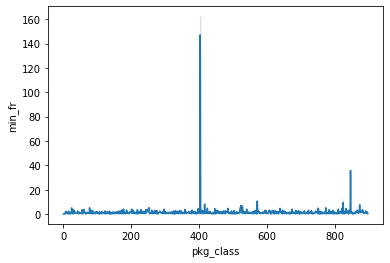

In [86]:
sns.lineplot(data=df_mean, x=df.pkg_class, y=df.min_fr)

In [110]:
df_mean.sort_values(by=['min_iou']).to_csv('csv/sortged.csv')

In [ ]:
df_mean['min_iou'](df_mean['min_iou'])

In [100]:
df_mean.sort_values(by=['min_iou'])['min_iou'].unique()
df_mean[(df_mean['min_fr'] < 1) & (df_mean['min_iou'] < 0.5)].index

Int64Index([  1,   3,   4,   5,   6,  11,  12,  13,  14,  15,
            ...
            859, 860, 861, 870, 885, 888, 893, 896, 897, 898],
           dtype='int64', name='pkg_class', length=386)

In [111]:
df = pd.read_csv('csv/2019-10-09.csv', index_col=None)
df = df[df['session_status'] == 'fail']

In [114]:
print(utils.pretty(df.session_traceback.unique()))

array(['Traceback (most recent call last):\n  File "/home/chaban/pharmapack-recognition/textdetector/runner.py", line 85, in _process_single_image\n    evaluator.evaluate(detection, annotation)\n  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 49, in evaluate\n    image_mask_warped, image_ref_mask_text\n  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 75, in _calc_false_ratio\n    return area_false_detection / area_reference\nZeroDivisionError: division by zero\n',
       'Traceback (most recent call last):\n  File "/home/chaban/pharmapack-recognition/textdetector/runner.py", line 85, in _process_single_image\n    evaluator.evaluate(detection, annotation)\n  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 45, in evaluate\n    image_mask_warped, image_ref_mask_text\n  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 59, in _calc_iou_ratio\n    image_overlap = cv.bitwise_and(image

In [ ]:
print(df.file_info_filename.tolist())

In [127]:
for un in df.session_traceback.unique():
    print(df[df.session_traceback == un].file_info_filename.iloc[0], un)

PFP_Ph2_P0297_D01_S001_C2_az220_side1 Traceback (most recent call last):
  File "/home/chaban/pharmapack-recognition/textdetector/runner.py", line 85, in _process_single_image
    evaluator.evaluate(detection, annotation)
  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 49, in evaluate
    image_mask_warped, image_ref_mask_text
  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 75, in _calc_false_ratio
    return area_false_detection / area_reference
ZeroDivisionError: division by zero

PFP_Ph1_P0356_D01_S001_C3_az200_side1 Traceback (most recent call last):
  File "/home/chaban/pharmapack-recognition/textdetector/runner.py", line 85, in _process_single_image
    evaluator.evaluate(detection, annotation)
  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 45, in evaluate
    image_mask_warped, image_ref_mask_text
  File "/home/chaban/pharmapack-recognition/textdetector/evaluator.py", line 59, in _calc_iou_ra